# Model simulation with RL

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
import gym
from gym import spaces
from IPython.display import HTML
import random
from collections import deque
import torch
import torch.nn as nn
import torch.optim as optim

In [16]:
def sample_position(L):
    """
    Sample random position in [-L, +L]^2.
    """
    return np.random.uniform(-L, L, size=2)

def make_periodic(positions, L):
    """
    Apply periodic boundary conditions to positions of shape (2, N).
    Range is [-L, +L] in both x and y.
    """
    return (positions + L) % (2*L) - L

def get_distance(pos1, pos2, L):
    """
    Calculate the Euclidean distance considering periodic boundaries.
    pos1, pos2: np.array of shape (2, N)
    L: float, environment size
    Returns distance matrix of shape (N, N)
    """
    delta = pos1[:, :, np.newaxis] - pos2[:, np.newaxis, :]
    delta = make_periodic(delta, L)
    distance = np.sqrt((delta ** 2).sum(axis=0))
    return distance

In [17]:
class ReplayBuffer:
    def __init__(self, capacity):
        self.buffer = deque(maxlen=capacity)
    
    def push(self, state, action, reward, next_state, done):
        self.buffer.append((state, action, reward, next_state, done))
    
    def sample(self, batch_size):
        batch = random.sample(self.buffer, batch_size)
        state, action, reward, next_state, done = map(np.stack, zip(*batch))
        return state, action, reward, next_state, done
    
    def __len__(self):
        return len(self.buffer)

In [18]:
class Actor(nn.Module):
    def __init__(self, input_dim, output_dim, hidden_dim=64):
        super(Actor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, output_dim),
            nn.Tanh()  
        )
    
    def forward(self, x):
        return self.net(x)

class Critic(nn.Module):
    def __init__(self, input_dim, hidden_dim=64):
        super(Critic, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1)
        )
    
    def forward(self, x):
        return self.net(x)

In [19]:
class Agent:
    def __init__(self, x, y, theta, speed, radius,
                 max_acc=1.0, max_angvel=0.5,
                 agent_type='prey'):
        """
        Initializes an agent with a heading-based movement model.

        Parameters:
        - x, y: Initial positions in [-L, +L]
        - theta: Initial heading angle (radians)
        - speed: Initial speed (|velocity|), set to 4 for predators and 3 for prey
        - radius: Radius for visualization
        - max_acc: Maximum forward acceleration
        - max_angvel: Maximum angular velocity (radians per second)
        - agent_type: 'predator', 'prey', or 'obstacle'
        """
        self.position = np.array([x, y], dtype=float)
        
        # Convert speed and theta to velocity components
        self.heading_angle = theta
        self.heading_vector = np.array([np.cos(theta), np.sin(theta)], dtype=float)

        # Store the agent's speed separately
        self.current_speed = speed  
        
        # Velocity always in heading direction * current_speed
        self.velocity = self.current_speed * self.heading_vector
        
        self.radius = radius
        self.agent_type = agent_type
        self.max_acc = max_acc
        self.max_angvel = max_angvel
        
        # Trace for visualization
        self.trace = []
        self.trace_len = 5
        self.trace.append(self.position.copy())

    def step(self, aF, aR, dt, L, speed_limit=10.0):
        """
        Updates the agent's state based on heading and forward acceleration.

        Parameters:
        - aF: Forward acceleration in [-1, 1]
        - aR: Rotational action in [-1, 1]
        - dt: Time step for integration
        - L: Half-size of the environment for periodic boundaries
        - speed_limit: Maximum allowable speed
        """
        if self.agent_type == 'obstacle':
            return

        # 1. Update heading angle
        turn_rate = aR * self.max_angvel
        self.heading_angle += turn_rate * dt
        self.heading_angle = (self.heading_angle + np.pi) % (2 * np.pi) - np.pi
        self.heading_vector = np.array([np.cos(self.heading_angle),
                                        np.sin(self.heading_angle)], dtype=float)
        
        # 2. Update scalar speed based on forward acceleration
        self.current_speed += aF * self.max_acc * dt
        if self.current_speed < 0.0:
            self.current_speed = 0.0
        if self.current_speed > speed_limit:
            self.current_speed = speed_limit
        
        # 3. Velocity is strictly heading_vector * current_speed
        self.velocity = self.current_speed * self.heading_vector
        
        # 4. Update position
        self.position += self.velocity * dt
        
        # 5. Apply periodic boundary conditions
        self.position = (self.position + L) % (2 * L) - L
        
        # 6. Update trace for visualization
        self.trace.append(self.position.copy())
        if len(self.trace) > self.trace_len:
            self.trace.pop(0)
    
    def get_heading_end(self, length=0.7):  
        """
        Returns the end position of the heading line for visualization.

        Parameters:
        - length: Length of the heading line

        Returns:
        - end_pos: np.array([x, y]) position of the heading line end
        """
        return self.position + self.heading_vector * length

In [20]:
class PredatorPreyEnv:
    def __init__(self, n_sp=2, n_p=3, n_e=10, n_o=5, L=10.0,
                 superior_predator_size=1.2, predator_size=0.8, prey_size=0.4, obstacle_size=0.6,
                 max_acc_sp=5.0, max_acc_pred=4.0, max_acc_prey=3.0,
                 max_angvel_sp=0.9, max_angvel_pred=0.7, max_angvel_prey=0.5):
        """
        Initializes the predator-prey environment with agents.
        """
        import math
        
        self.n_sp = n_sp  
        self.n_p = n_p
        self.n_e = n_e
        self.n_o = n_o  
        self.L = L
        self.superior_predator_size = superior_predator_size
        self.predator_size = predator_size
        self.prey_size = prey_size
        self.obstacle_size = obstacle_size  
        
        self.max_acc_sp = max_acc_sp
        self.max_acc_pred = max_acc_pred
        self.max_acc_prey = max_acc_prey
        
        self.max_angvel_sp = max_angvel_sp
        self.max_angvel_pred = max_angvel_pred
        self.max_angvel_prey = max_angvel_prey
        
        # Initialize agents list
        self.agents = []
        
        # 1. Initialize superior predators
        for _ in range(n_sp):
            theta = np.random.uniform(-math.pi, math.pi)
            speed = 5.0 
            x = np.random.uniform(-L, L)
            y = np.random.uniform(-L, L)
            superior_predator = Agent(x, y, theta, speed, self.superior_predator_size,
                                      max_acc=self.max_acc_sp, max_angvel=self.max_angvel_sp,
                                      agent_type='superior_predator')
            self.agents.append(superior_predator)
        
        # 2. Initialize predators with fixed speed=4
        for _ in range(n_p):
            theta = np.random.uniform(-math.pi, math.pi)
            speed = 4.0  
            x = np.random.uniform(-L, L)
            y = np.random.uniform(-L, L)
            predator = Agent(x, y, theta, speed, self.predator_size,
                            max_acc=self.max_acc_pred, max_angvel=self.max_angvel_pred,
                            agent_type='predator')
            self.agents.append(predator)
        
        # 3. Initialize prey with fixed speed=3
        for _ in range(n_e):
            theta = np.random.uniform(-math.pi, math.pi)
            speed = 3.0  
            x = np.random.uniform(-L, L)
            y = np.random.uniform(-L, L)
            prey = Agent(x, y, theta, speed, self.prey_size,
                        max_acc=self.max_acc_prey, max_angvel=self.max_angvel_prey,
                        agent_type='prey')
            self.agents.append(prey)
        
        # 4. Initialize obstacles with speed=0
        for _ in range(n_o):
            theta = 0.0  
            speed = 0.0  
            x = np.random.uniform(-L, L)
            y = np.random.uniform(-L, L)
            obstacle = Agent(x, y, theta, speed, self.obstacle_size,
                            max_acc=0.0, max_angvel=0.0,
                            agent_type='obstacle')
            self.agents.append(obstacle)
        
        self.predator_prey_contacts = set()
        self.superior_predator_predator_contacts = set()
    
    def reset(self):
        """
        Resets the environment by re-initializing all agents' positions and velocities.
        Ensures no initial overlaps.
        """
        # Reset agents
        for ag in self.agents:
            if ag.agent_type == 'obstacle':
                ag.position = sample_position(self.L)
                ag.velocity = np.array([0.0, 0.0])
                ag.trace = [ag.position.copy()]
                continue

            placed = False
            tries = 0
            while not placed and tries < 500:
                tries += 1
                pos = sample_position(self.L)
                if self._no_overlap(pos, ag):
                    ag.position = pos
                    # Reset velocity based on fixed speed and new heading
                    angle = np.random.uniform(-np.pi, np.pi)
                    ag.heading_angle = angle
                    ag.heading_vector = np.array([np.cos(angle), np.sin(angle)], dtype=float)
                    if ag.agent_type == 'predator':
                        speed = 4.0
                    elif ag.agent_type == 'superior_predator':
                        speed = 5.0
                    else:
                        speed = 3.0
                    ag.velocity = speed * ag.heading_vector
                    # Reset trace
                    ag.trace = [ag.position.copy()]
                    placed = True
            if not placed:
                print(f"Failed to place {ag.agent_type} after 500 attempts.")
        
        # Reset contact tracking sets
        self.predator_prey_contacts = set()
        self.superior_predator_predator_contacts = set()
        
        return self._get_obs()
    
    def step(self, actions):
        """
        Advances the simulation by one time step based on agent actions.

        Parameters:
        - actions: A dictionary with keys 'superior_predator', 'predator', 'prey'.
                  Each key maps to a NumPy array of shape (n_sp, 2), (n_p, 2), or (n_e, 2),
                  where each row corresponds to (aF, aR) actions for an agent.
                  Obstacles are ignored.

        Returns:
        - obs: observation after the step.
        - rewards: dictionary with keys 'superior_predator', 'predator', 'prey',
                   each mapping to a NumPy array of rewards for the agents.
        - done: boolean flag for episode termination.
        - info: additional info (empty in this case).
        """
        dt = 0.2  # Time step
        
        # Retrieve actions for each species.
        actions_sp = actions.get('superior_predator', np.zeros((self.n_sp, 2)))
        actions_p = actions.get('predator', np.zeros((self.n_p, 2)))
        actions_e = actions.get('prey', np.zeros((self.n_e, 2)))
        
        # Assign actions to agents.
        sp_indices = range(0, self.n_sp)
        p_indices = range(self.n_sp, self.n_sp + self.n_p)
        e_indices = range(self.n_sp + self.n_p, self.n_sp + self.n_p + self.n_e)
        
        for idx in sp_indices:
            ag = self.agents[idx]
            aF, aR = actions_sp[idx]
            ag.step(aF, aR, dt, self.L)
        
        for idx, ag_idx in enumerate(p_indices):
            ag = self.agents[ag_idx]
            aF, aR = actions_p[idx]
            ag.step(aF, aR, dt, self.L)
        
        for idx, ag_idx in enumerate(e_indices):
            ag = self.agents[ag_idx]
            aF, aR = actions_e[idx]
            ag.step(aF, aR, dt, self.L)
        
        # Obstacles do not take actions
        
        # Collision Handling
        self._collision_handling()
        
        # Initialize rewards.
        rewards_superior_predator = np.zeros(self.n_sp)
        rewards_predator = np.zeros(self.n_p)
        rewards_prey = np.zeros(self.n_e)
        
        # Define indices.
        superior_predators = range(0, self.n_sp)
        predators = range(self.n_sp, self.n_sp + self.n_p)
        prey = range(self.n_sp + self.n_p, self.n_sp + self.n_p + self.n_e)
        
        # Compute predator-prey contacts.
        for p_idx, predator in enumerate(predators):
            for e_idx, prey_agent in enumerate(prey):
                dist = np.linalg.norm(self.agents[predator].position - self.agents[prey_agent].position)
                if dist < (self.agents[predator].radius + self.agents[prey_agent].radius):
                    rewards_predator[p_idx] += 1.0  
                    rewards_prey[e_idx] -= 1.0      
        
        # Compute superior_predator-predator contacts.
        for sp_idx, sup_predator in enumerate(superior_predators):
            for p_idx, predator in enumerate(predators):
                dist = np.linalg.norm(self.agents[sup_predator].position - self.agents[predator].position)
                if dist < (self.agents[sup_predator].radius + self.agents[predator].radius):
                    rewards_superior_predator[sp_idx] += 1.0  
                    rewards_predator[p_idx] -= 1.0           
        
        # Assemble the reward dictionary.
        rewards = {
            'superior_predator': rewards_superior_predator,
            'predator': rewards_predator,
            'prey': rewards_prey
        }
        
        
        obs = self._get_obs()
        
        info = {}
        
        return obs, rewards, done, info

    
    def _no_overlap(self, pos, agent):
        """
        Check if the given position 'pos' does not overlap with any existing agent.
        Obstacles are considered during placement of predators and prey.
        """
        for other in self.agents:
            if other is agent:
                continue
            dist = np.linalg.norm(pos - other.position)
            if dist < (agent.radius + other.radius):
                return False
        return True
    
    def _collision_handling(self):
        """
        Prevent agents from overlapping by applying a repulsive force
        based on their distances. Obstacles are immovable.
        """
        for i, agent1 in enumerate(self.agents):
            for j, agent2 in enumerate(self.agents):
                if i >= j:
                    continue  

                # Calculate distance vector between agents
                dx = agent2.position[0] - agent1.position[0]
                dy = agent2.position[1] - agent1.position[1]

                # Apply periodic boundary corrections
                if dx > self.L:
                    dx -= 2 * self.L
                elif dx < -self.L:
                    dx += 2 * self.L
                if dy > self.L:
                    dy -= 2 * self.L
                elif dy < -self.L:
                    dy += 2 * self.L

                # Calculate Euclidean distance
                dist = np.sqrt(dx**2 + dy**2)
                min_dist = agent1.radius + agent2.radius

                # If agents overlap, apply a repulsive force to separate them
                if dist < min_dist and dist > 1e-6:  
                    overlap = min_dist - dist
                    repulsion_strength = 0.5  
                    # Unit vector for repulsive direction
                    nx = dx / dist
                    ny = dy / dist

                    # Determine if agents are movable
                    movable1 = agent1.agent_type != 'obstacle'
                    movable2 = agent2.agent_type != 'obstacle'

                    if movable1 and movable2:
                        # Both agents are movable; move both
                        agent1.position[0] -= repulsion_strength * overlap * nx / 2
                        agent1.position[1] -= repulsion_strength * overlap * ny / 2
                        agent2.position[0] += repulsion_strength * overlap * nx / 2
                        agent2.position[1] += repulsion_strength * overlap * ny / 2
                    elif movable1 and not movable2:
                        # Only agent1 is movable
                        agent1.position[0] -= repulsion_strength * overlap * nx
                        agent1.position[1] -= repulsion_strength * overlap * ny
                    elif not movable1 and movable2:
                        # Only agent2 is movable
                        agent2.position[0] += repulsion_strength * overlap * nx
                        agent2.position[1] += repulsion_strength * overlap * ny
                    # If neither is movable, do nothing

                    # Apply periodic boundary corrections again
                    if movable1:
                        agent1.position = make_periodic(agent1.position, self.L)
                    if movable2:
                        agent2.position = make_periodic(agent2.position, self.L)

    
    def _get_obs(self):
        """
        Return positions and velocities of all agents.
        Shape: (4, total_agents)
        """
        positions = np.array([ag.position for ag in self.agents]).T  # Shape: (2, N)
        velocities = np.array([ag.velocity for ag in self.agents]).T  # Shape: (2, N)
        return np.vstack((positions, velocities))
    
    
    def get_positions(self):
        """
        Retrieves the current positions of all agents.

        Returns:
        - A NumPy array of shape (2, total_agents) containing x and y positions.
        """
        XY = []
        for ag in self.agents:
            XY.append(ag.position.copy())
        return np.array(XY).T  # Shape: (2, N)
    
    def get_colors(self):
        colors = []
        for ag in self.agents:
            if ag.agent_type == 'superior_predator':
                colors.append('yellow')
            elif ag.agent_type == 'predator':
                colors.append('red')
            elif ag.agent_type == 'prey':
                colors.append('blue')
            else:  
                colors.append('gray')
        return colors

    def get_sizes(self):
        sizes = []
        for ag in self.agents:
            if ag.agent_type == 'superior_predator':
                sizes.append(self.superior_predator_size * 300)
            elif ag.agent_type == 'predator':
                sizes.append(self.predator_size * 300)
            elif ag.agent_type == 'prey':
                sizes.append(self.prey_size * 300)
            else:  
                sizes.append(self.obstacle_size * 300)
        return sizes


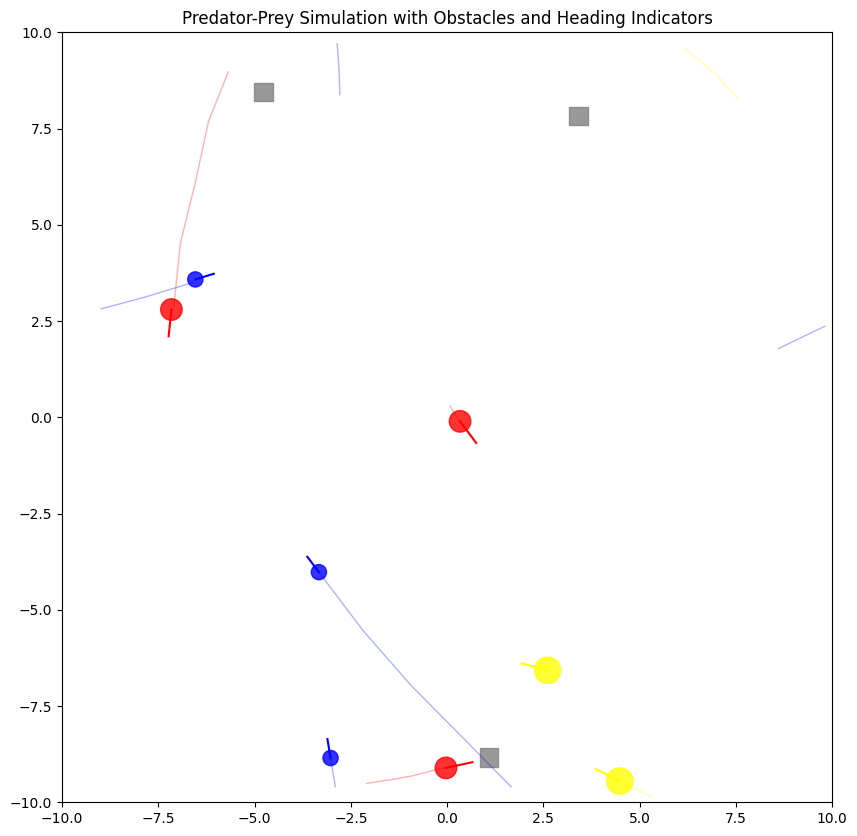

In [21]:
# Initialize the environment 
env = PredatorPreyEnv(n_sp=2, n_p=3, n_e=3, n_o=3,  L=10.0,
                      predator_size=0.8, prey_size=0.4, obstacle_size=0.6,
                      max_acc_pred=4.0, max_acc_prey=3.0,  
                      max_angvel_pred=0.7, max_angvel_prey=0.5)

# Reset environment
obs = env.reset()

# Setup Matplotlib Figure
fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlim(-env.L, env.L)
ax.set_ylim(-env.L, env.L)
ax.set_aspect("equal")
ax.set_title("Predator-Prey Simulation with Obstacles and Heading Indicators")

positions = env.get_positions()
predator_prey_positions = positions[:, [i for i, ag in enumerate(env.agents) if ag.agent_type != 'obstacle']]
obstacle_positions = positions[:, [i for i, ag in enumerate(env.agents) if ag.agent_type == 'obstacle']]

predator_prey_colors = [env.get_colors()[i] for i, ag in enumerate(env.agents) if ag.agent_type != 'obstacle']
obstacle_colors = [env.get_colors()[i] for i, ag in enumerate(env.agents) if ag.agent_type == 'obstacle']

predator_prey_sizes = [env.get_sizes()[i] for i, ag in enumerate(env.agents) if ag.agent_type != 'obstacle']
obstacle_sizes = [env.get_sizes()[i] for i, ag in enumerate(env.agents) if ag.agent_type == 'obstacle']

scat = ax.scatter(predator_prey_positions[0], predator_prey_positions[1],
                  c=predator_prey_colors, s=predator_prey_sizes, alpha=0.8)

scat_obstacles = ax.scatter(obstacle_positions[0], obstacle_positions[1],
                             c=obstacle_colors, s=obstacle_sizes, alpha=0.8, marker='s')

# Lines for traces
lines = []
for ag in env.agents:
    if ag.agent_type == 'obstacle':
        # Obstacles do not have traces
        (ln,) = ax.plot([], [], lw=1.0, alpha=0.3, 
                        color='gray',
                        linestyle='-')
    else:
        (ln,) = ax.plot([], [], lw=1.0, alpha=0.3, 
                        color='yellow' if ag.agent_type == 'superior_predator' else ('red' if ag.agent_type == 'predator' else 'blue'),
                        linestyle='-')
    lines.append(ln)

# Lines for headings
heading_lines = []
for ag in env.agents:
    if ag.agent_type == 'obstacle':
        heading_line, = ax.plot([], [], lw=1.5, color='gray')
    elif ag.agent_type == 'superior_predator':
        heading_line, = ax.plot([], [], lw=1.5, color='yellow')
    else:
        heading_line, = ax.plot([], [], lw=1.5, color='red' if ag.agent_type == 'predator' else 'blue')
    heading_lines.append(heading_line)



# Animation Functions
def init_anim():
    scat.set_offsets(env.get_positions().T)
    for ln in lines:
        ln.set_data([], [])
    for hl in heading_lines:
        hl.set_data([], [])
    return [scat, *lines, *heading_lines]

def animate_anim(frame):
    actions_pred = np.random.uniform(-1,1,(env.n_p,2))
    actions_prey = np.random.uniform(-1,1,(env.n_e,2))
    actions_sp = np.random.uniform(-1, 1, (env.n_sp, 2))  
    actions_dict = {
        'superior_predator': actions_sp,
        'predator': actions_pred,
        'prey': actions_prey
    }

    
    env.step(actions_dict)
    
    # Update scatter plot
    pos = env.get_positions()
    predator_prey_positions = pos[:, [i for i, ag in enumerate(env.agents) if ag.agent_type != 'obstacle']]
    obstacle_positions = pos[:, [i for i, ag in enumerate(env.agents) if ag.agent_type == 'obstacle']]
    
    scat.set_offsets(predator_prey_positions.T)
    scat_obstacles.set_offsets(obstacle_positions.T)
    
    # Update traces: Insert NaNs to break lines when necessary
    for i, ag in enumerate(env.agents):
        if ag.agent_type == 'obstacle':
            lines[i].set_data([], [])
            heading_lines[i].set_data([], [])
            continue

        raw_trace = np.array(ag.trace)  # shape (steps,2)
        
        # Build separate arrays x, y with possible NaNs
        xlist = []
        ylist = []
        prev = raw_trace[0]
        xlist.append(prev[0])
        ylist.append(prev[1])
        
        for k in range(1, len(raw_trace)):
            curr = raw_trace[k]
            dx = curr[0] - prev[0]
            dy = curr[1] - prev[1]
            dist = np.sqrt(dx*dx + dy*dy)

            if dist > 3.0:
                xlist.append(np.nan)
                ylist.append(np.nan)
            xlist.append(curr[0])
            ylist.append(curr[1])
            prev = curr
        
        # Update the trace line data
        lines[i].set_data(xlist, ylist)
        
        # Update the heading line
        if ag.agent_type == 'prey':
            heading_end = ag.get_heading_end(length=0.5)  
        else:
            heading_end = ag.get_heading_end(length=0.7)  
        heading_lines[i].set_data([ag.position[0], heading_end[0]],
                                   [ag.position[1], heading_end[1]])
    
    return [scat, scat_obstacles, *lines, *heading_lines]


# Create Animation
ani = animation.FuncAnimation(
    fig, animate_anim, init_func=init_anim,
    frames=200, interval=100,
    blit=True, repeat=True
)

# Display Animation Inline
HTML(ani.to_jshtml())

# To save the animation as a GIF, uncomment the following line:
# ani.save("predator_prey_simulation_with_obstacles.gif", writer="pillow")